# Machine Design Homework - 1

**Course:** ME4403 - Machine Design  
**Instructor:** Dr. [Bill Jones]  
**Due Date:** [09/10/2024]  
**By** Andrew Trepagnier - alt658

## Table of Contents

1. **Problem 3.41**
  

2. **Problem 3.62**
  
3. **Problem 3.64**
   
4. **Problem 3.81**
   
5. **Problem 3.127**

6. **Problem 3.134**

7. **Problem 3.153**

8. **Problem 4.87**

9. **Problem 4.132**

   

 # Problem 3.41

**A pin in a knuckle joint carrying a tensile load F deflects somewhat on account of
this loading, making the distribution of reaction and load as shown in part (b) of the
figure. A common simplification is to assume uniform load distributions, as shown in
part (c). To further simplify, designers may consider replacing the distributed loads
with point loads, such as in the two models shown in parts d and e. If a = 0.5 in,
b = 0.75 in, d = 0.5 in, and F = 1000 lbf, estimate the maximum bending stress and
the maximum shear stress due to V for the three simplified models. Compare the three
models from a designer’s perspective in terms of accuracy, safety, and modeling time**

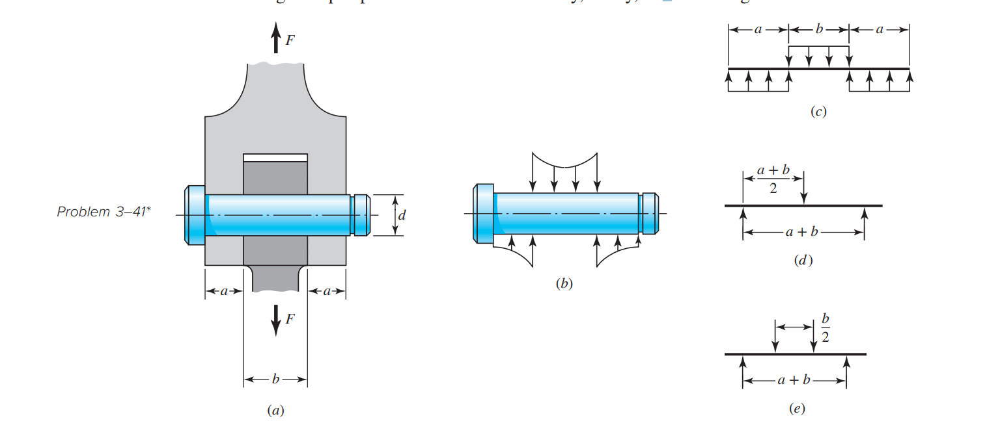

In [1]:
import sympy as sp
import matplotlib as plt
F = 1000 # lbf
a = 0.5 # in
b = 0.75 # in
d = 0.5 # in
r = d/2

c = d/2

# estimate the max bending stress and the max shear stress due to V for the model's c, d, and e

I = 0.25*sp.pi*r**4
print(float(I))
SIGMA_MAX = sp.Symbol('M')*c / I


0.0030679615757712823


## Plots

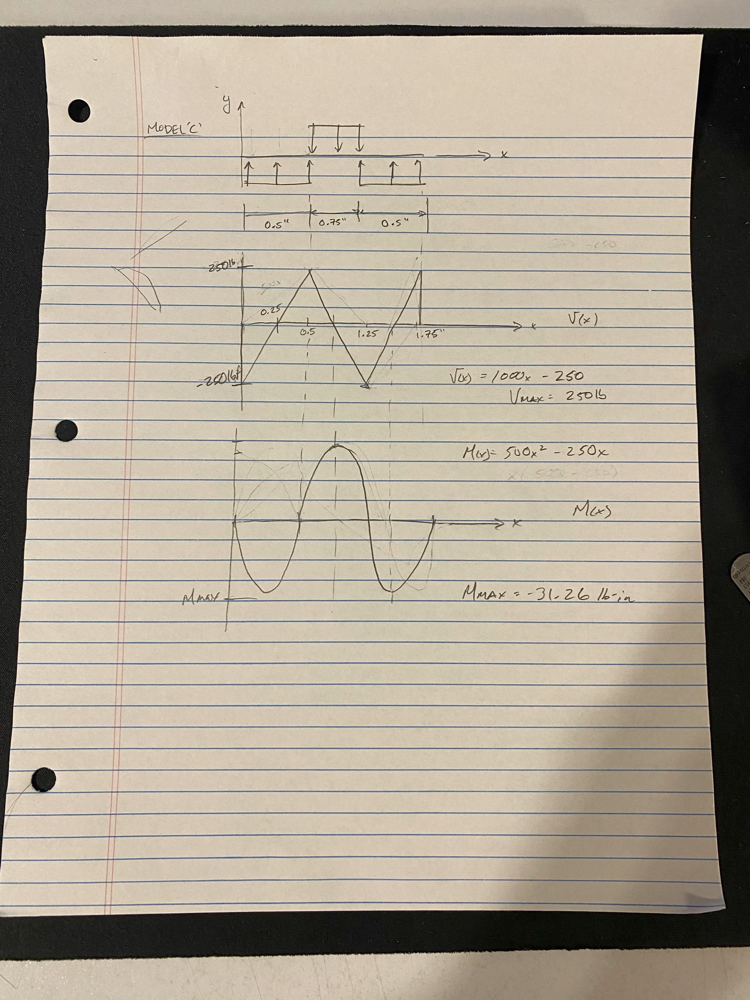

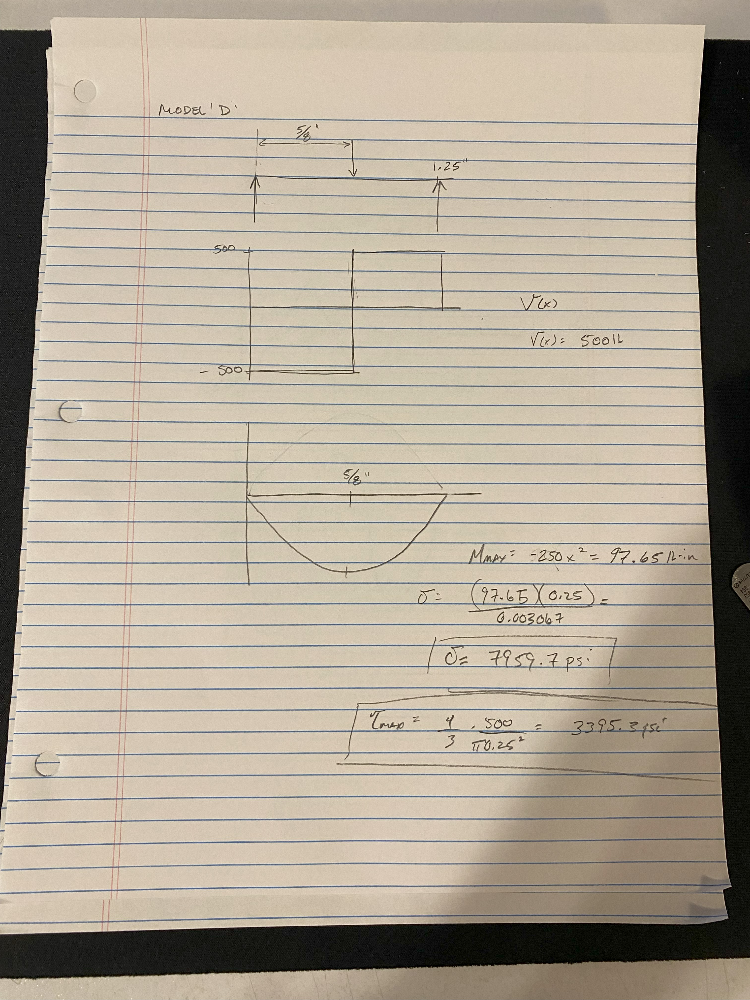

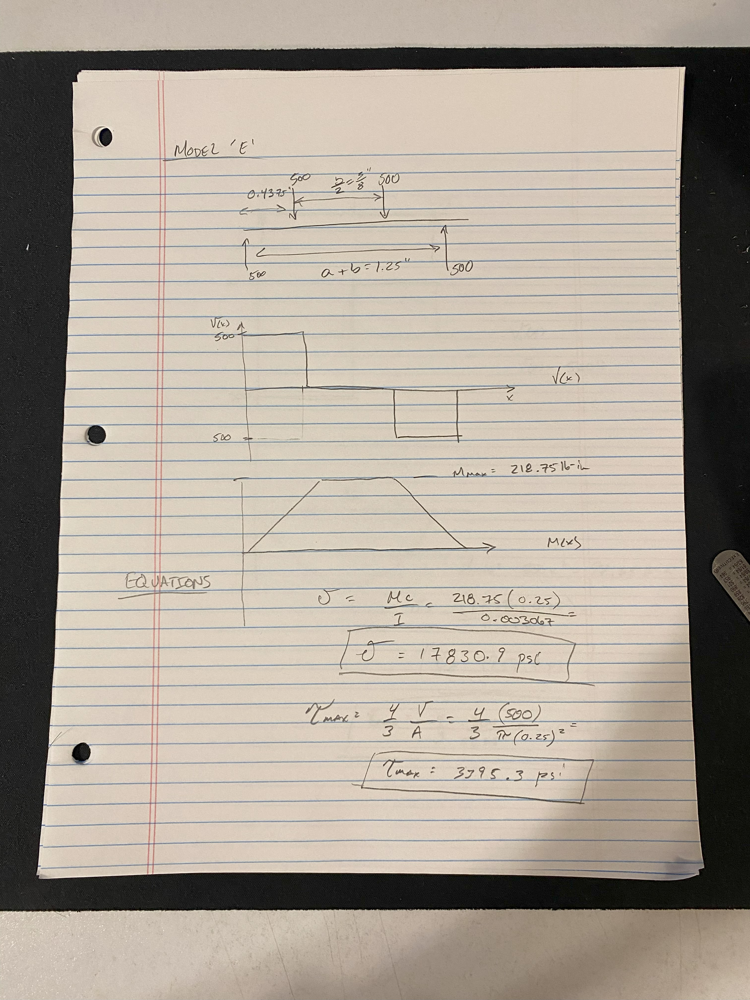

# Problem 3.62
**Consider a 1-in-square steel thin-walled tube loaded in torsion. The tube has a wall
thickness t = 1
16 in, is 36 in long, and has a maximum allowable shear stress of 12 kpsi.
Determine the maximum torque that can be applied and the corresponding angle of
twist of the tube**


### Part A

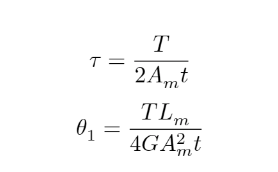

In [2]:
import sympy as sp
import matplotlib as plt

# My Solution

l = 36 #in
ri = 0
t = sp.Rational(1,16)
Lm = (1- t)*4
Tau_max = 12000 #psi
Am = (1-t)**2 # Typical for square thin walled tubes, rectangles would look like Ex: (1-t)(3-t)
G = 11.5e6 # Based on Table A-5

Torq = Tau_max*2*Am*t

print(Torq.n(), "lb-in")



phi = (Torq*Lm) / (4*G*(Am**2)*t) # in radians, multiply by 180/pi to convert to degrees

phi_deg = (180/(3.141))*phi

print(phi_deg, "degrees")


1318.35937500000 lb-in
0.127569453095802 degrees


### Part B

In [3]:

# All variables the same except we have fillets with radius of 1/8"

dm_fillets = (0.125 + (0.125 + 0.125)) / (2) # di+do/2 gives dm of a circle, which each fillet combines to make

Am_fillet = (3.141*(dm_fillets)**2)/4

Am_square = (0.75 - t)**2

Am_b = Am_square+Am_fillet

Torq_b = Tau_max*2*Am_b*t

print("Torque for thin walled tube with fillets is: ", Torq_b, "lb-in")

# Find Angle of Torque

phi_b = (Torq_b*Lm) / (4*G*(Am_b**2)*t) # in radians, multiply by 180/pi to convert to degrees

phi_b_deg = (180/(3.141))*phi_b

print("The angle of torque is ", phi_b_deg, "degrees")

Torque for thin walled tube with fillets is:  750.394042968750 lb-in
The angle of torque is  0.224125425872386 degrees


# Problem 3.64
**The thin-walled open cross section shown is transmitting torque T. The angle of twist
per unit length of each leg can be determined separately using Equation (3–47) and
is given by**

## Part A

### My Solution

In [4]:
#each leg is steel and has a max allowable shear stress of 12kpsi

# the angle of twist in each leg is the same

#Given

c1 = 2 * 10**-3#mm to m
c2 = 3 * 10**-3#mm
c3 = 0 *10**-3#mm

tau_max = 12000*6894.79 #psi to Pa

L1 = 0.020 #mm
L2 = 0.030 #mm
L3 = 0

G = 79.3*(10**9)
# find the torque transmitted by each leg and the torque transmitted by the entire section
# Part B First to find angle of torque

theta = tau_max / (c2*G)

print("Angle of Torque [rad/m]", theta) # in rad/m

# Torques for each leg

T1 = theta*(G*L1*(c1**3))/(3)
T2 = theta*(G*L2*(c2**3))/(3)
T3 = theta*(G*L3*(c3**3))/(3)

print("Torque 1 [N-m]:",T1)
print("Torque 2  [N-m]:",T2)
print("Torque 3  [N-m]:",T3)
# all in units of N-m
# add together to get total torque

T_total = T1+T2+T3

print("Combined Torques [N-m]", T_total)

Angle of Torque [rad/m] 0.3477825977301387
Torque 1 [N-m]: 1.4708885333333335
Torque 2  [N-m]: 7.4463732
Torque 3  [N-m]: 0.0
Combined Torques [N-m] 8.917261733333333


# Problem 3.81

**A countershaft carrying two V-belt pulleys is shown in the figure. Pulley A receives
to power from a motor through a belt with the belt tensions shown. The power is transmitted
3–82* through the shaft and delivered to the belt on pulley B. Assume the belt tension on
the loose side at B is 15 percent of the tension on the tight side.**

### Free Body Diagrams

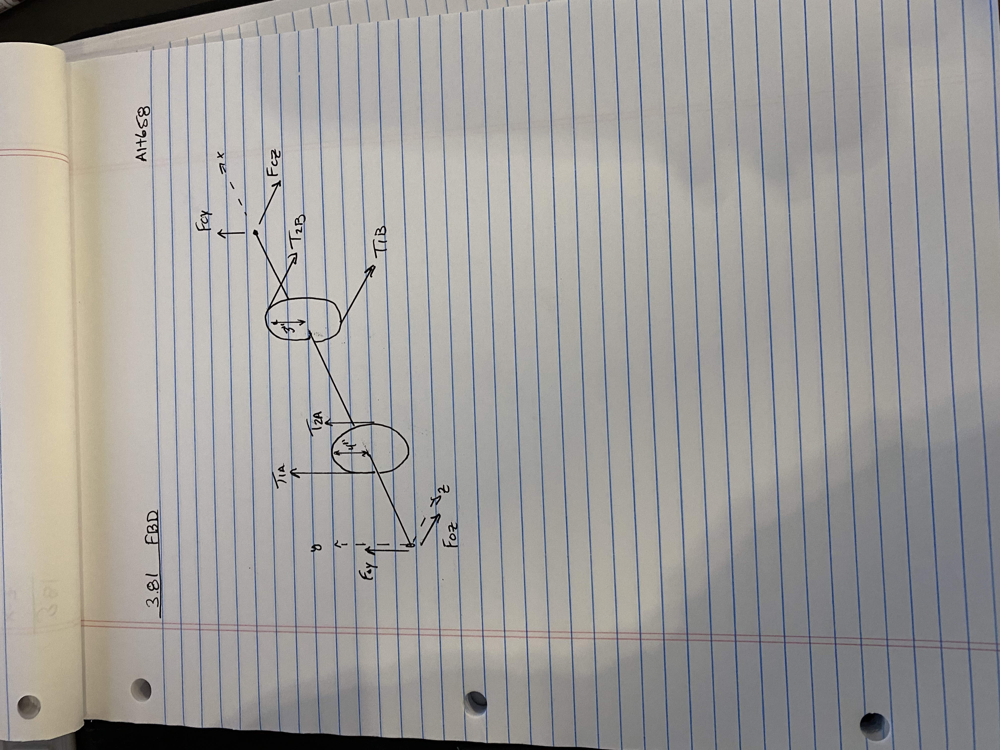

### My Solution

### Part A

In [5]:
T1a = 300 #lbf
T2a = 50
ra = 4 # in
rb = 3 # in

Ma = (T1a - T2a)*4

Mb = Ma

T2b = 1000/(0.85*3)
# 1000 is the moment created my the 300 and 50 forces on pully A, 250*4
print("Tension of T2b is [lbf]:",T2b)

T1b = 0.15*T2b # Relationship Equation
print("Tension of T1a is [lbf]", T1b)

Tension of T2b is [lbf]: 392.15686274509807
Tension of T1a is [lbf] 58.82352941176471


### Part B

In [6]:
l1 = 8 #in
l2 = 8
l3 = 6


# Sum of forces: Fx = 0
# Fox + Fcx + T2b +T1b =0 

# Sum of forces: Fy = 0
# Foy + Fcy + T1a + T2a = 0

# Solve moment equation about y axis to find Fcx
# M = l*F
print("Reaction forces at Bearings:")
Fcz = (-1*(l1 +l2)*(T2b+T1b))/(l1+l2+l3)
print("Fcz is [lbf]", Fcz)

# Solve moment equation about x axis to find Fcy

Fcy = (-1*(l1)*(T1a+T2a))/(l1+l2+l3)
print("Fcy is [lbf]", Fcy)

Foy = -1*(T1a+T2a+Fcy)
print("Foy is [lbf]:", Foy)

Foz = -1*(T1b+T2b+Fcz)
print("Foz is [lbf]:", Foz)


Reaction forces at Bearings:
Fcz is [lbf] -327.98573975044565
Fcy is [lbf] -127.27272727272727
Foy is [lbf]: -222.72727272727275
Foz is [lbf]: -122.99465240641712


### Part C

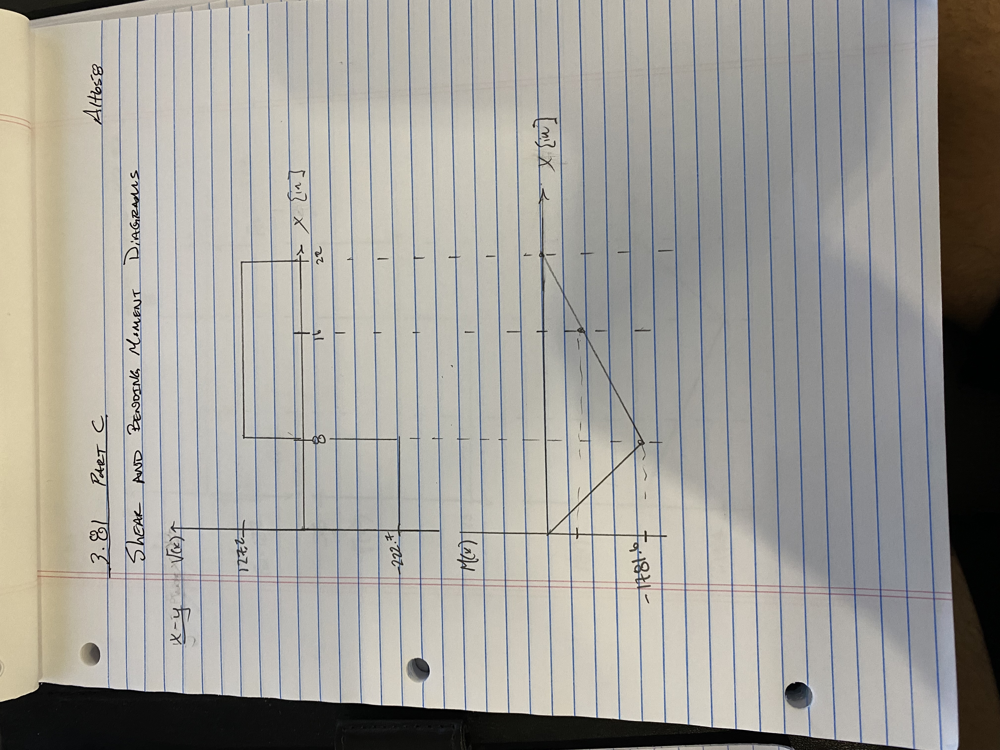


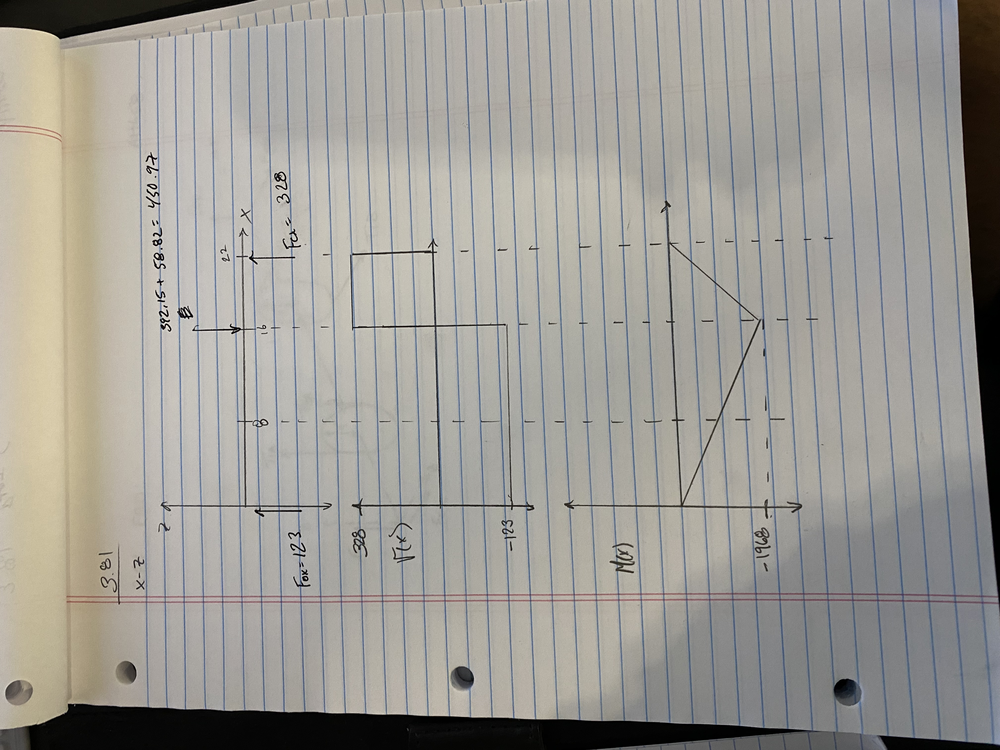

## Part D

## Equations

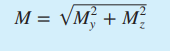

In [7]:
# Net Bending Moment, we can evaluate these at point A and point B of the pully's to get the max bending moment

In [8]:
Ma = sp.sqrt((1781.6**2 + 983.9**2))
Mb = sp.sqrt((1968**2 + 764**2))

print("Max bending moments at A",float(Ma))
print("Max bending moments at B",float(Mb))

print("The maximum bending moment occurs at B [lbf-in], ", float(Mb))


Max bending moments at A 2035.2291689144001
Max bending moments at B 2111.0945028586475
The maximum bending moment occurs at B [lbf-in],  2111.0945028586475


In [9]:
# The maximum bending stess is evaluated with 

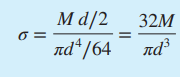

In [10]:
Sig_b = (Mb*32)/(sp.pi*(1**3))
print(float(Sig_b), " psi")

21503.43202970119  psi


In [11]:
# The maximum torsional shear stress

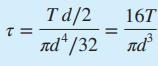

In [12]:
Tau_AB = (16*((T1a-T2a))*4)/(sp.pi*1**3)
print(float(Tau_AB), " psi")

5092.958178940651  psi


## Part E

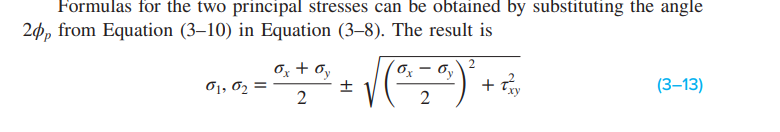

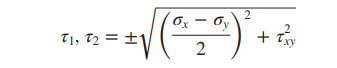

In [13]:
# At the point of the maximum bending moment, which is B

# The maximum tensile stress will be
Sig_1 = (Sig_b/2)+sp.sqrt((Sig_b/2)**2 + Tau_AB**2)

# the maximum compressive stress will be
Sig_2 = (Sig_b/2)-sp.sqrt((Sig_b/2)**2 + Tau_AB**2)
Tau_1 = sp.sqrt((Sig_b/2)**2+ Tau_AB**2)
print("The max tensile stress [psi]: ", float(Sig_1))
print("The max compressive stress [psi]:", float(Sig_2))
print("The shear stress is [psi]", float(Tau_1))


The max tensile stress [psi]:  22648.67446129535
The max compressive stress [psi]: -1145.2424315941612
The shear stress is [psi] 11896.958446444756


#  Problem 3.127

***The table lists the maximum and minimum hole and shaft dimensions for a variety of
to standard press and shrink fits. The materials are both hot-rolled steel. Find the maximum and minimum values of the radial interference and the corresponding interface pressure.
Use a collar diameter of 100 mm for the metric sizes and 4 in for those in inch units.***

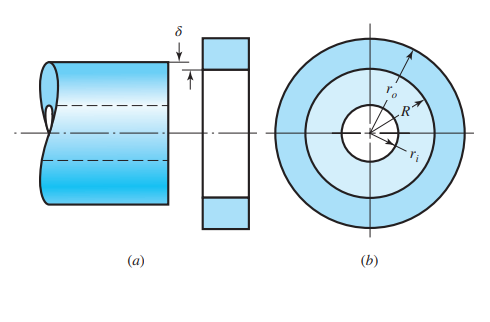

In [14]:
# Fit Designation (2 in) H7/ s6
R = 1 #in this is the nominal radius or basic size divided by 2 to get it as a radius
hole_Rmax = 2.0010/2

hole_Rmin = 2.0000/2

shaft_rmax = 2.0023/2

shaft_rmin = 2.0017/2

collar_dia = 4 # in
collar_rad = 2
# materials are both hot-rolled steel
E = 30e6

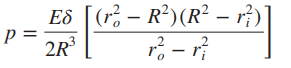

In [15]:
# where p is the interface contact pressure
# and delta is the radial interference

The max size of the shaft and the min size of the hole will create the maximum radial interference
To get the smallest amount of interference, we use the smallest shaft size with the largest hole size

In [16]:
delta_max = shaft_rmax - hole_Rmin 
print("Delta Max is ", delta_max, "inches")

Delta Max is  0.0011499999999999844 inches


In [17]:
delta_min = shaft_rmin - hole_Rmax 
print("Delta Max is ", delta_min, "inches")

Delta Max is  0.0003500000000000725 inches


In [18]:
p_max = ((E*delta_max)/(2*R**3))*(((collar_rad**2 - R**2)*(R**2 - 0))/(collar_rad**2))

print("P max is: ", p_max, "psi")

P max is:  12937.499999999825 psi


In [19]:
p_min = ((E*delta_min)/(2*R**3))*(((collar_rad**2 - R**2)*(R**2 - 0))/(collar_rad**2))

print("P min is: ", p_min, "psi")

P min is:  3937.500000000815 psi


# Problem 3-134

**A utility hook was formed from a round rod of diameter d = 20 mm into the geometry shown in the figure. What are the stresses at the inner and outer surfaces at section A–A if F = 4 kN, L = 250 mm, and Di = 75 mm?**

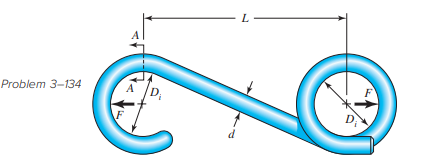

In [20]:
# Define Knowns
d = 20/1000 # m
R = d/2
F = 4000 # n

L = 250/1000 #m
Di = 75/1000 # m
ri = Di/2
ro = ri + d 
# found on page 191


Round Cross Section so use Table 3-4 to get Neutral axis radius equation

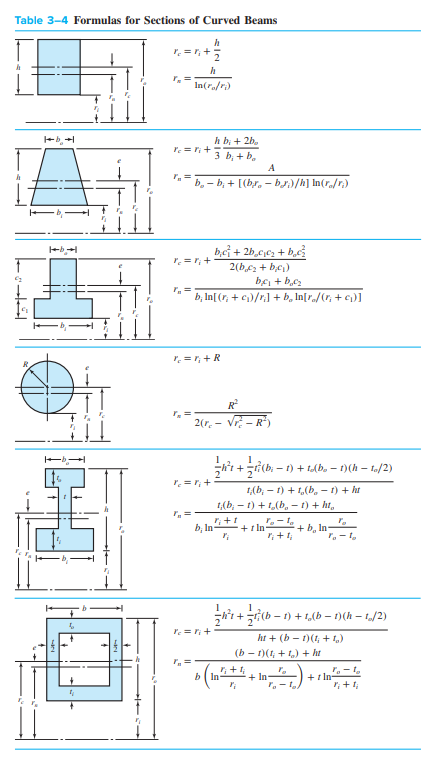

In [21]:
# Where:

# rc = radius of the centroid axis
# rn = radius of the neutral axis
# R = Outer radius of cross section

In [22]:
rc = Di/2 + R
rn = (R**2) / (2*(rc - sp.sqrt(rc**2 - R**2)))

print("rc is [m], ", rc)
print("rn is [m], ", rn)



rc is [m],  0.0475
rn is [m],  0.0469677195262585


In [23]:
# Ecentricity, e, distance from the centroid to nuetral axis 
e = (rc - rn)
print(e)

0.000532280473741521


In [24]:
# Moment Calculation is M = F*rc

M = F*(rc)
print("M = ", M)

M =  190.0


In [25]:
# Important !

# co = distance from neutral axis to outer fiber
# ci = distance from neutral axis to the inner fiber

# We defined our nuetral axis as rn
# We defined our inner radius as ri
# We defined our outer radius as ro

ci = (rn - ri) # converted to meters, m
co = (ro - rn)

A = sp.pi*(10/1000)**2 # make sure you use the right Radius here, it should be the solid rod radius


In [26]:
# We're asked to evaluate for the inner and outer surfaces of the hook

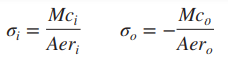

In [27]:
Sig_inner = (M*ci)/(A*e*ri) + F/A
Sig_outer = -1*((M*co)/(A*e*ro)) + F/A

print("Sigma inner is [Pa] = ", float(Sig_inner))
print("Sigma outer is [Pa] = ", float(Sig_outer))

Sigma inner is [Pa] =  299597227.5368592
Sigma outer is [Pa] =  -195389496.21969065


# Problem 3-153

**An aluminum alloy cylindrical roller with diameter 1.25 in and length 2 in rolls on the
inside of a cast-iron ring having an inside radius of 6 in, which is 2 in thick. Find the
maximum contact force F that can be used if the shear stress is not to exceed 4000 psi.**

In [28]:
# Shear Stress, Tau_max cannot exceed 4000 psi

Tau_max = 4000 # psi

# solve for pmax so we can find the contact force, F





# Problem 4-87

**The figure shows a rectangular member OB, made from 0.5-cm thick aluminum
plate, pinned to the ground at one end and supported by a coil spring at point A.
The spring has been measured to deflect 1 mm with an applied force of 10 kN.
Find the deflection at point B. Use Castigliano’s method directly without using
superposition or indirect geometric extrapolations. Organize your work in the
following manner:
(a) Determine the component of the deflection at B due to the energy in section OA.
(b) Determine the component of the deflection at B due to the energy in section AB.
(c) Determine the component of the deflection at B due to the energy in section AC.
You may find it helpful to consider the definition of strain energy in Equation (4–15),
and apply it to the spring.
(d) Determine the total deflection at B due to all of the components combined.**


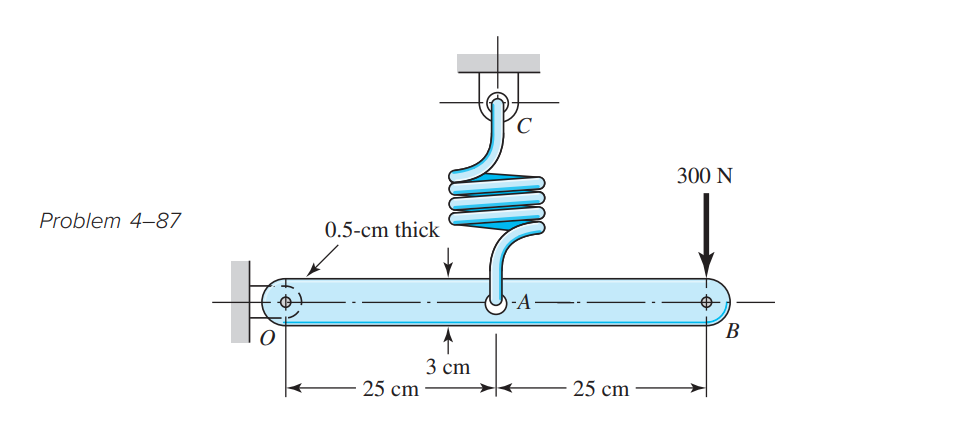

# Problem 4-132

**The figure shows a schematic drawing of a vehicular jack that is to be designed to
support a maximum mass of 300 kg based on the use of a design factor nd = 3.50. The
opposite-handed threads on the two ends of the screw are cut to allow the link angle θ
to vary from 15 to 70°. The links are to be machined from AISI 1010 hot-rolled steel
bars. Each of the four links is to consist of two bars, one on each side of the central
bearings. The bars are to be 350 mm long and have a bar width of w = 30 mm. The
pinned ends are to be designed to secure an end-condition constant of at least C = 1.4
for out-of-plane buckling. Find a suitable preferred thickness and the resulting factor
of safety for this thickness**

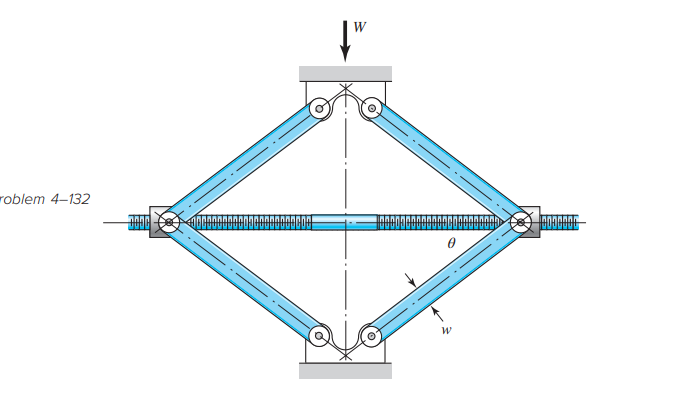

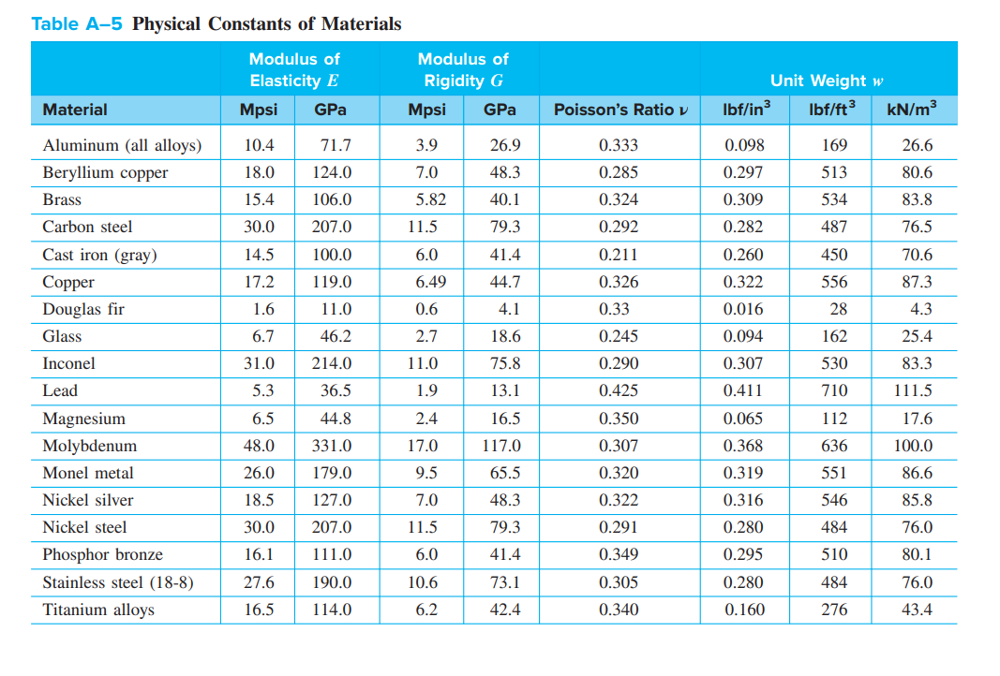

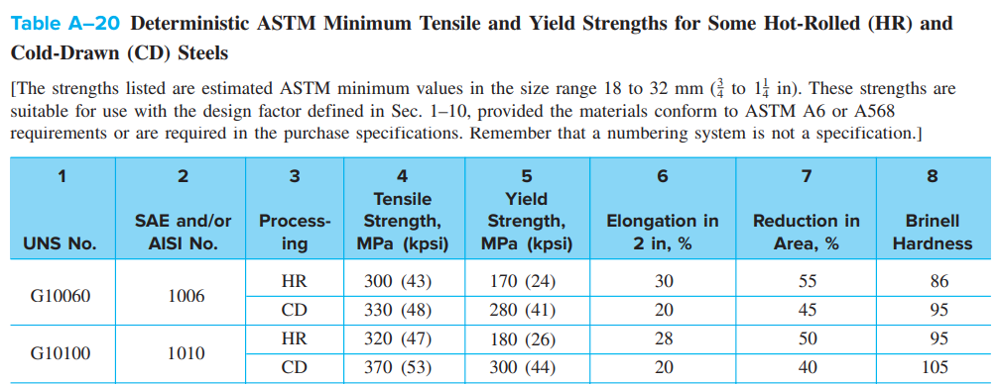

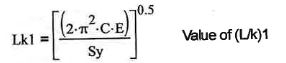

In [29]:
# Refer to Tables A-5 and A-20 to pull values for AISI HR Steel 1010. 
l = 350/1000 # m

Sy = 180e6 #Pa
E = 270e9 #Pa
C = 1.4

m = 300 #kg


lk_1 = ( (2*C*E*sp.pi**2 )/(Sy) )**0.5
print(float(lk_1))

203.59847367938517


In [30]:
# Find the maxiumum compressive force first
# Use the FBD below

In [31]:
# Sum of forces in y = 0
# -w + 2Fsin(theta) + 2Fsin(Theta) = 0
# Solve for F, then F * Safety factor = Pcr

# To get the largest compressive force, choose the smallest angle
w = m*9.81

factor_safety = 3.5

theta = 15*(sp.pi/180)
F = (w/(4*sp.sin(theta)))
print(float(F))

Pcr = factor_safety*F
print("The Pcr is [N]:", float(Pcr))

2842.719706768728
The Pcr is [N]: 9949.518973690549


In [32]:
t = sp.Symbol('t')
width = 30/1000

k = t/sp.sqrt(12) #since I is for rectangular prism
A = t*width
eq1 = sp.Eq(Pcr, (A*C*(sp.pi**2)*E)/((l/k)**2))
eq1.n()

Eq(9949.51897369055, 76136948236.9751*t**3)

In [33]:
t_sol = (sp.solve(eq1)[0])
print(float(t_sol))

0.005074604572488663


This thickness is slightly larger than 5mm, so we should go up to the next commercially avialable thickness, 6mm. Now ensure it is still appropiate to use Euler's formula: (l/k) > (l/k)1


In [34]:
lk = l/(0.006/sp.sqrt(12))
print(float(lk))
if lk > lk_1:
    print("yes")
else:
    print("no")

202.072594216369
no


The Euler equation was appropiate to use for t_sol, however, to evaluate at 6mm we must use the parabolic equation

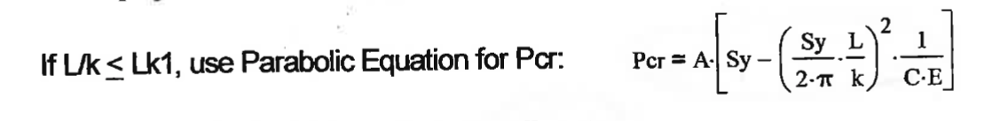

In [35]:
# solve for Pcr with parabolic


eq2 = sp.Eq(Pcr, (A*(Sy - (Sy*l/2*sp.pi*k)**2 * (1/(C*E)) ))) 
Pcr_new = eq2.rhs.subs(t, sp.S('0.006'))
print(float(Pcr_new))

32399.999986009832


In [36]:
# new factor of safety
print(float(Pcr_new/F))

11.39753592619878
